In [1]:
!pip install opencv-contrib-python

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [2]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
from datetime import datetime
%matplotlib inline

In [3]:
n_matches = 20

In [9]:
def keypointsAndDescriptors(img):
    sift = cv2.xfeatures2d.SIFT_create()
    return sift.detectAndCompute(img, None)

# calculating Euclidean distance
# using linalg.norm()
def L2_norm(x, y):
    return np.linalg.norm((x - y), ord=1)

def ownMatcher(descriptor1, descriptor2):
    matches = []

    for i, el1 in enumerate(descriptor1):
        for j, el2 in enumerate(descriptor2):
            matches.append(
                cv2.DMatch(
                    _distance=L2_norm(el1, el2),
                    _imgIdx=0,
                    _queryIdx=i,
                    _trainIdx=j
                )
            )

    return matches

In [10]:
def drawMatcher(image1, image2, descriptors1, descriptors2, keypoints1, keypoints2, matches, title):
    plt.figure(figsize=(25, 15))
    plt.axis('off')
    match_img = cv2.drawMatches(image1, keypoints1, image2, keypoints2, matches, None, flags=cv2.DrawMatchesFlags_NOT_DRAW_SINGLE_POINTS)
    plt.title(f'{title}', fontsize=30)
    plt.axis('off')
    plt.imshow(match_img)
    plt.show()

In [11]:
def compare_matchers(des1, des2):
    start = datetime.now()
    matches12_own = ownMatcher(des1, des2)
    print("Custom Brute Force matcher took:", datetime.now() - start)

    start = datetime.now()
    bf = cv2.BFMatcher(cv2.NORM_L1, crossCheck=True)
    matches12_bf = bf.match(des1, des2)
    print("CV2 Brute Force matcher took:", datetime.now() - start)

    return matches12_own, matches12_bf

In [12]:
def pipeline(path1, path2):
    img1 = cv2.imread(path1)
    # SIFT operates only on grayscale images anyway,
    img1 = cv2.cvtColor(img1, cv2.COLOR_BGR2RGB)
    img2 = cv2.imread(path2)
    img2 = cv2.cvtColor(img2, cv2.COLOR_BGR2RGB)

    figure, ax = plt.subplots(1, 2, figsize=(16, 8))

    ax[0].imshow(img1)
    ax[1].imshow(img2)

    kp1, des1 = keypointsAndDescriptors(img1)
    kp2, des2 = keypointsAndDescriptors(img2)

    matches_own, matches_bf = compare_matchers(des1, des2)

    best_matches_own = sorted(matches_own, key=lambda x: x.distance)
    best_matches_own = best_matches_own[:n_matches]

    best_matches_bf = sorted(matches_bf, key=lambda x: x.distance)
    best_matches_bf = best_matches_bf[:n_matches]

    drawMatcher(img1, img2, des1, des2, kp1, kp2, best_matches_own, f"Own Brute Force Matcher( {n_matches} matches)")
    drawMatcher(img1, img2, des1, des2, kp1, kp2, best_matches_bf, f"CV2 Brute Force Matcher ( {n_matches} matches)")
    
    return des1, des2, matches_own, matches_bf

Custom Brute Force matcher took: 0:00:51.737957
CV2 Brute Force matcher took: 0:00:00.748625


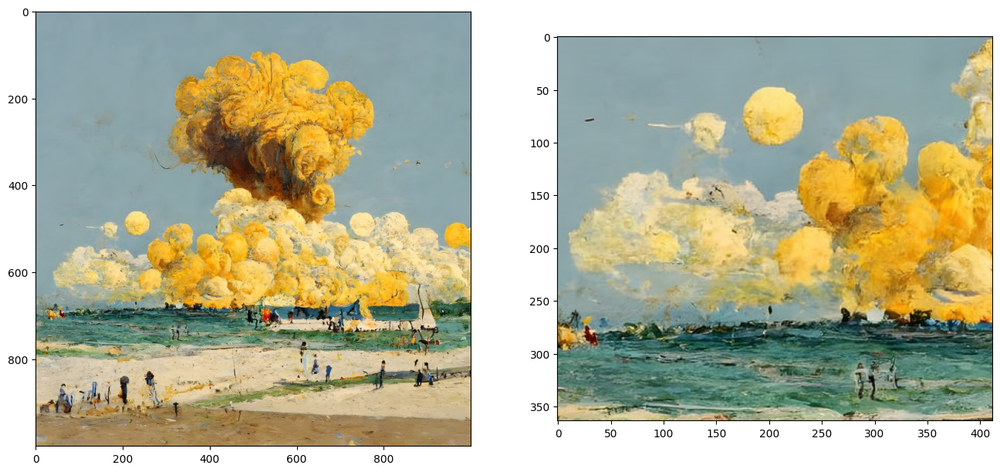

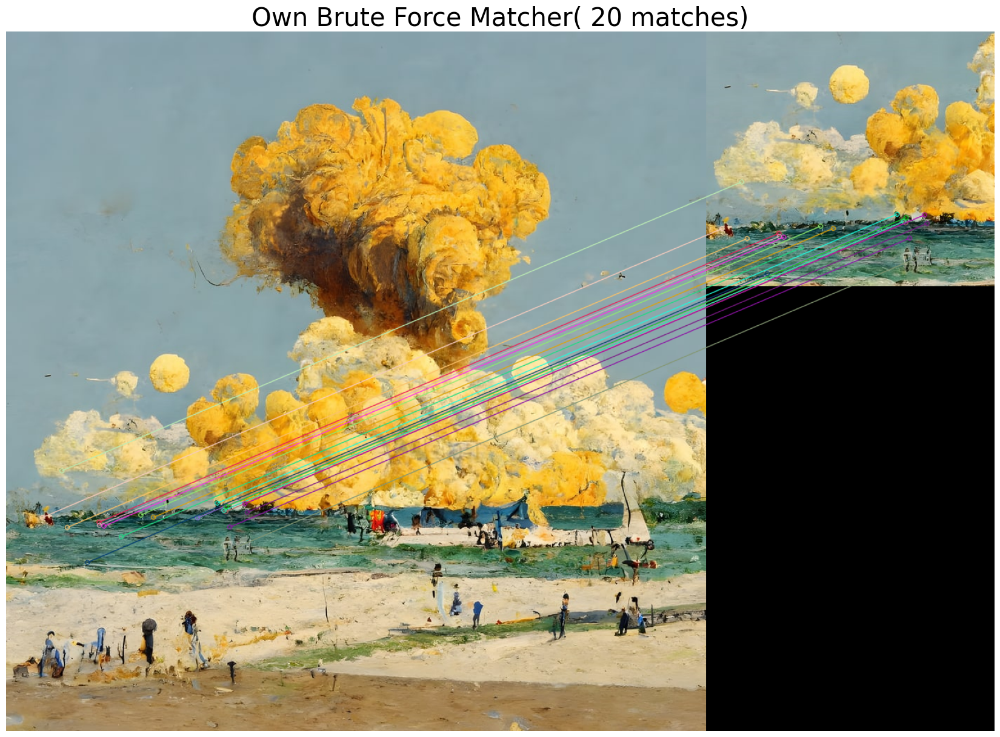

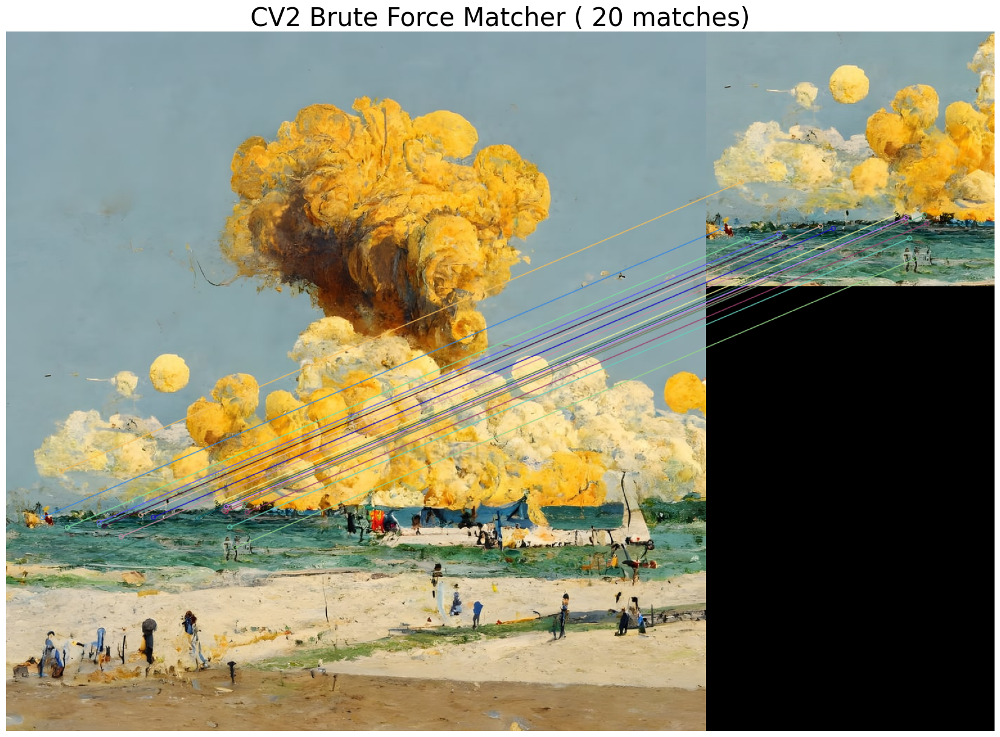

In [15]:
des3, des4, matches_own, matches_bf = pipeline("/content/Img2.jpg", "/content/Crop2.png")

Custom Brute Force matcher took: 0:01:23.355881
CV2 Brute Force matcher took: 0:00:00.727760


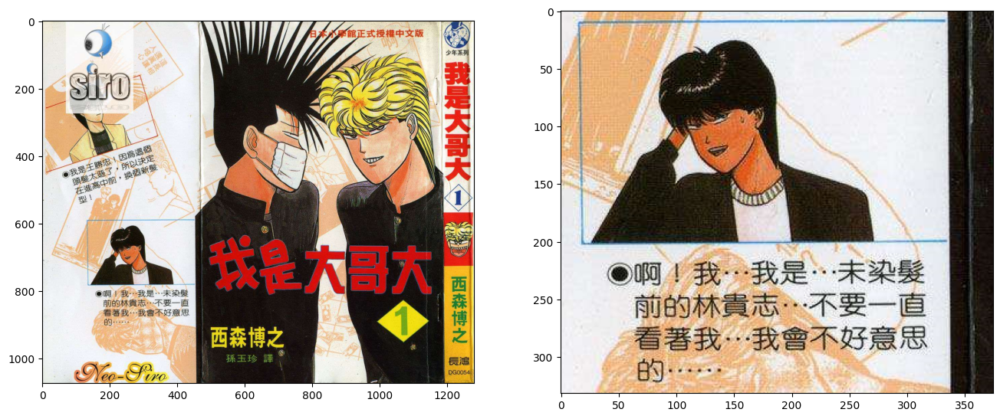

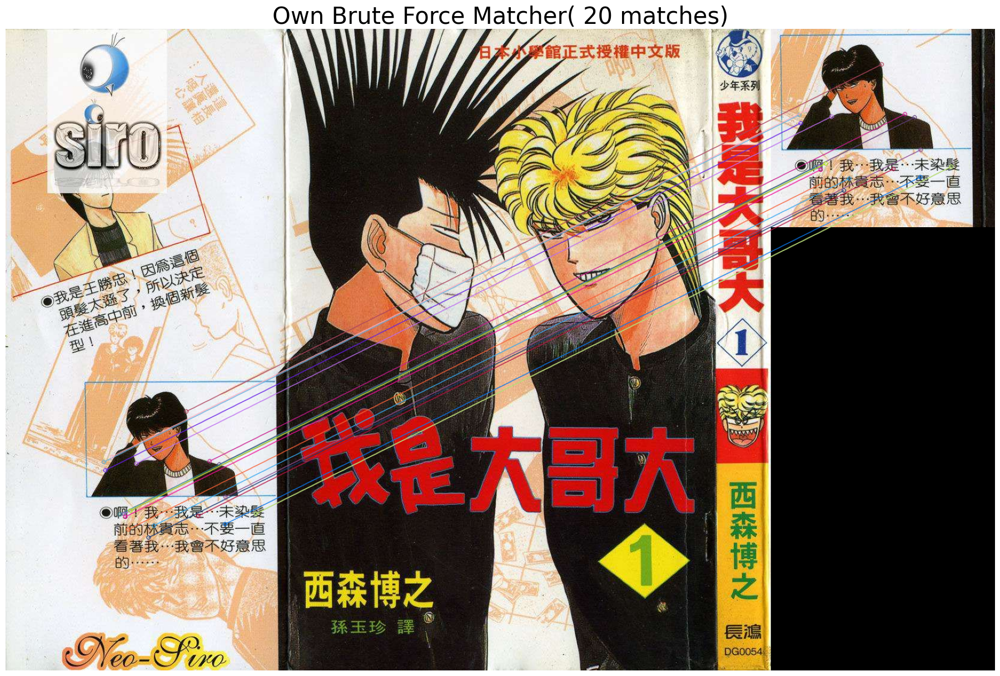

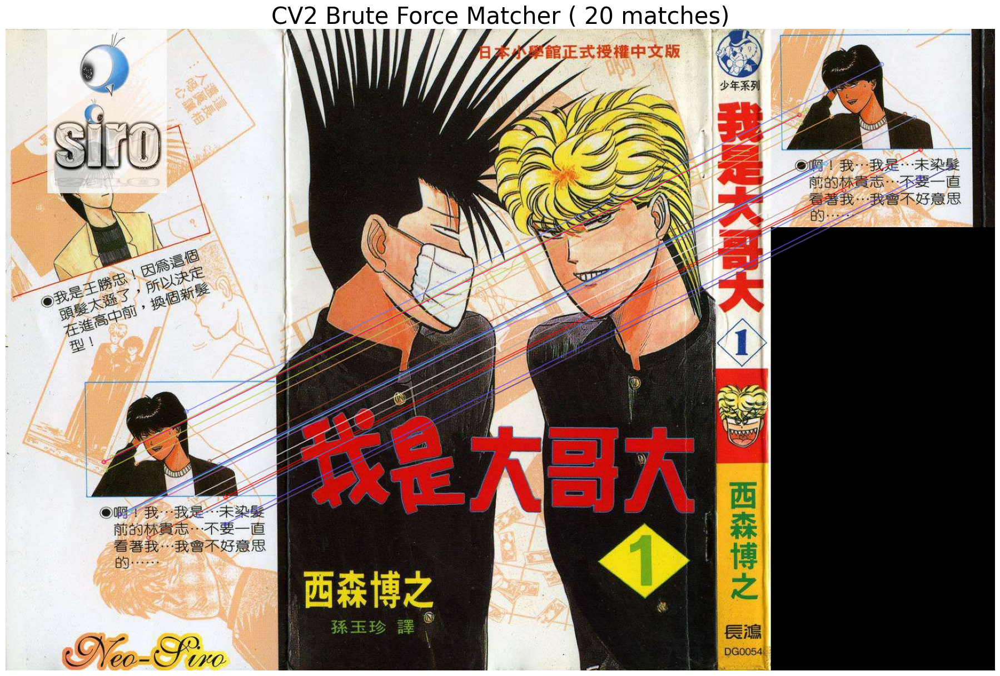

In [16]:
des1, des2, matches12_own, matches12_bf = pipeline("/content/Img1.jpg", "/content/Crop1.png")